**Skin Condition Classifier using EfficientNetB0**
==========================================================

- This notebook builds an image classification model using transfer learning with EfficientNetB0.

- It classifies six skin conditions: Acne, Carcinoma, Eczema, Keratosis, Milia, and Rosacea.


# --------------------------------------------------------------
# 📦 1. Import Libraries and Configure Environment
# --------------------------------------------------------------

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import layers, models
from sklearn.metrics import classification_report, confusion_matrix

warnings.filterwarnings('ignore')
sns.set(style='whitegrid')
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.18.0


# ------------------------------------------------------------------------
# 📁 2. Load Dataset and Split into Train / Validation / Test Sets
# ------------------------------------------------------------------------

In [3]:
dataset_path = '/content/drive/MyDrive/Colab_Notebooks/Skin_Conditions'
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 123

# Load dataset with integer labels suitable for sparse_categorical_crossentropy
full_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    label_mode='int'  # 🧠 Integer labels (0–5)
)

# Extract and show class labels
class_names = full_dataset.class_names
print("\n✅ Class labels:", class_names)

# Performance optimization for loading
AUTOTUNE = tf.data.AUTOTUNE
full_dataset = full_dataset.cache().shuffle(1000).prefetch(AUTOTUNE)

# Dataset split ratios
total_batches = tf.data.experimental.cardinality(full_dataset).numpy()
train_size = int(0.7 * total_batches)
val_size = int(0.15 * total_batches)
test_size = total_batches - train_size - val_size

# Perform splits
train_data = full_dataset.take(train_size)
val_data = full_dataset.skip(train_size).take(val_size)
test_data = full_dataset.skip(train_size + val_size)

# Prefetch for performance
train_data = train_data.prefetch(AUTOTUNE)
val_data = val_data.prefetch(AUTOTUNE)
test_data = test_data.prefetch(AUTOTUNE)

# Log splits
print(f"\n✅ Train batches: {train_size}")
print(f"✅ Validation batches: {val_size}")
print(f"✅ Test batches: {test_size}")

Found 2396 files belonging to 6 classes.

✅ Class labels: ['Acne', 'Carcinoma', 'Eczema', 'Keratosis', 'Milia', 'Rosacea']

✅ Train batches: 52
✅ Validation batches: 11
✅ Test batches: 12


# ---------------------------------------------
# 🖼️ 3. Visual Inspection of Sample Images
# ---------------------------------------------

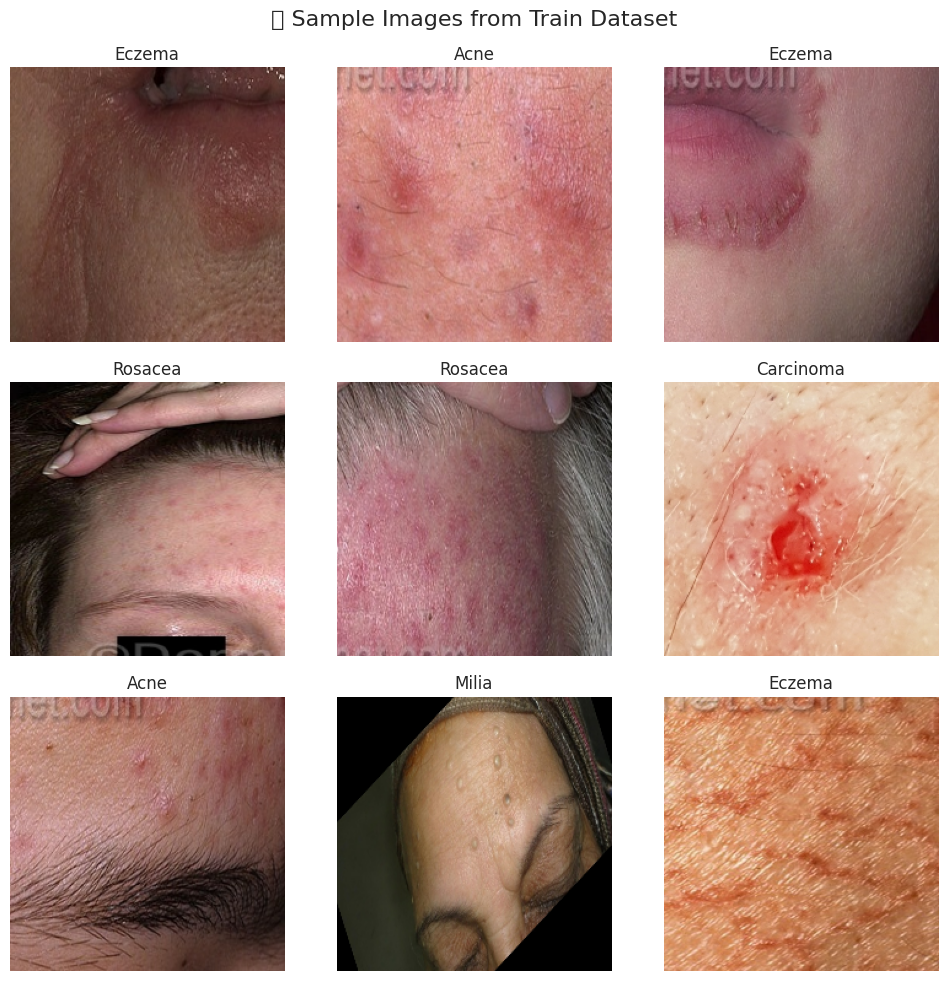

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.suptitle("🔍 Sample Images from Train Dataset", fontsize=16)
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# 🏗️ 4. Build the EfficientNetB0 Transfer Learning Model
# ---------------------------------------------------

In [4]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1)
])

IMG_SHAPE = (224, 224, 3)
base_model_effnet = EfficientNetB0(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')
base_model_effnet.trainable = False

efficientnet_model = models.Sequential([
    data_augmentation,
    layers.Lambda(preprocess_input),           # Only this for preprocessing
    base_model_effnet,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(6, activation='softmax')
])


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


# --------------------------------------
# ⚙️ 5. Compile the Model
# --------------------------------------

In [5]:
efficientnet_model.compile(
    optimizer=Adam(learning_rate=1e-4),  # Lower LR for transfer learning
    loss='sparse_categorical_crossentropy',  # Integer labels (not one-hot)
    metrics=['accuracy']
)

# Display model architecture
efficientnet_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 4,049,571 (15.45 MB)

# ---------------------------------------------------
# 🚀 6. Train the Model with Callbacks
# ---------------------------------------------------

In [6]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Stop training when validation loss stops improving
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

# Save the best model based on validation loss
model_checkpoint = ModelCheckpoint(
    filepath='best_efficientnet_model.keras',
    save_best_only=True,
    monitor='val_loss',
    verbose=1
)

# Train the model
history_effnet = efficientnet_model.fit(
    train_data,
    validation_data=val_data,
    epochs=20,
    callbacks=[early_stop, model_checkpoint],
    verbose=1
)

Epoch 1/20
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2914 - loss: 1.7281
Epoch 1: val_loss improved from inf to 1.34255, saving model to best_efficientnet_model.keras
52/52 ━━━━━━━━━━━━━━━━━━━━ 876s 3s/step - accuracy: 0.2930 - loss: 1.7259 - val_accuracy: 0.5994 - val_loss: 1.3425
Epoch 2/20
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5711 - loss: 1.3135
Epoch 2: val_loss improved from 1.34255 to 1.07184, saving model to best_efficientnet_model.keras
52/52 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - accuracy: 0.5714 - loss: 1.3126 - val_accuracy: 0.6989 - val_loss: 1.0718
Epoch 3/20
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6206 - loss: 1.1405
Epoch 3: val_loss improved from 1.07184 to 0.88244, saving model to best_efficientnet_model.keras
52/52 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.6211 - loss: 1.1395 - val_accuracy: 0.7585 - val_loss: 0.8824
Epoch 4/20
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7130 - loss: 0.9541
Epoch 4: val_loss improved fro

# --------------------------------------------
# 📈 7. Evaluate Final Model on Test Set
# --------------------------------------------

In [7]:
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.efficientnet import preprocess_input

# Load best model (with correct custom preprocessing)
best_efficientnet_model = load_model(
    'best_efficientnet_model.keras',
    custom_objects={'preprocess_input': preprocess_input}
)

# Evaluate
test_loss, test_accuracy = best_efficientnet_model.evaluate(test_data, verbose=1)
print(f"\n📊 Final EfficientNetB0 Test Accuracy: {test_accuracy * 100:.2f}%")
print(f"📉 Final EfficientNetB0 Test Loss: {test_loss:.4f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.8387 - loss: 0.4706

📊 Final EfficientNetB0 Test Accuracy: 82.11%
📉 Final EfficientNetB0 Test Loss: 0.4993


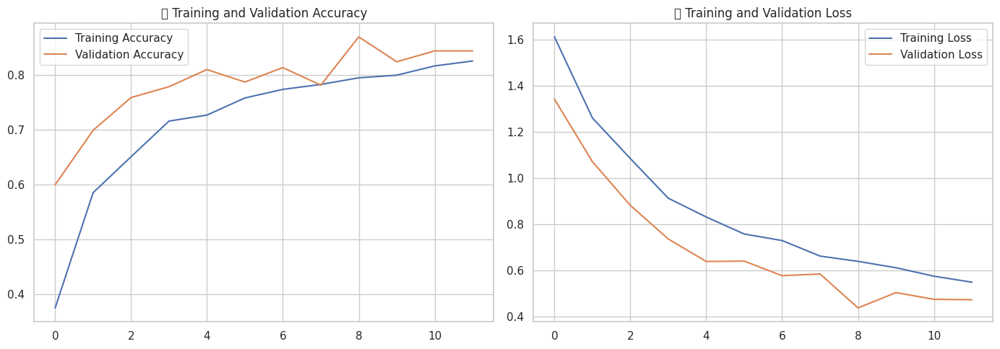

In [10]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(len(acc))

    plt.figure(figsize=(14, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.title('✅ Training and Validation Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.title('📉 Training and Validation Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
plot_training_history(history_effnet)


# Checking with test data

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


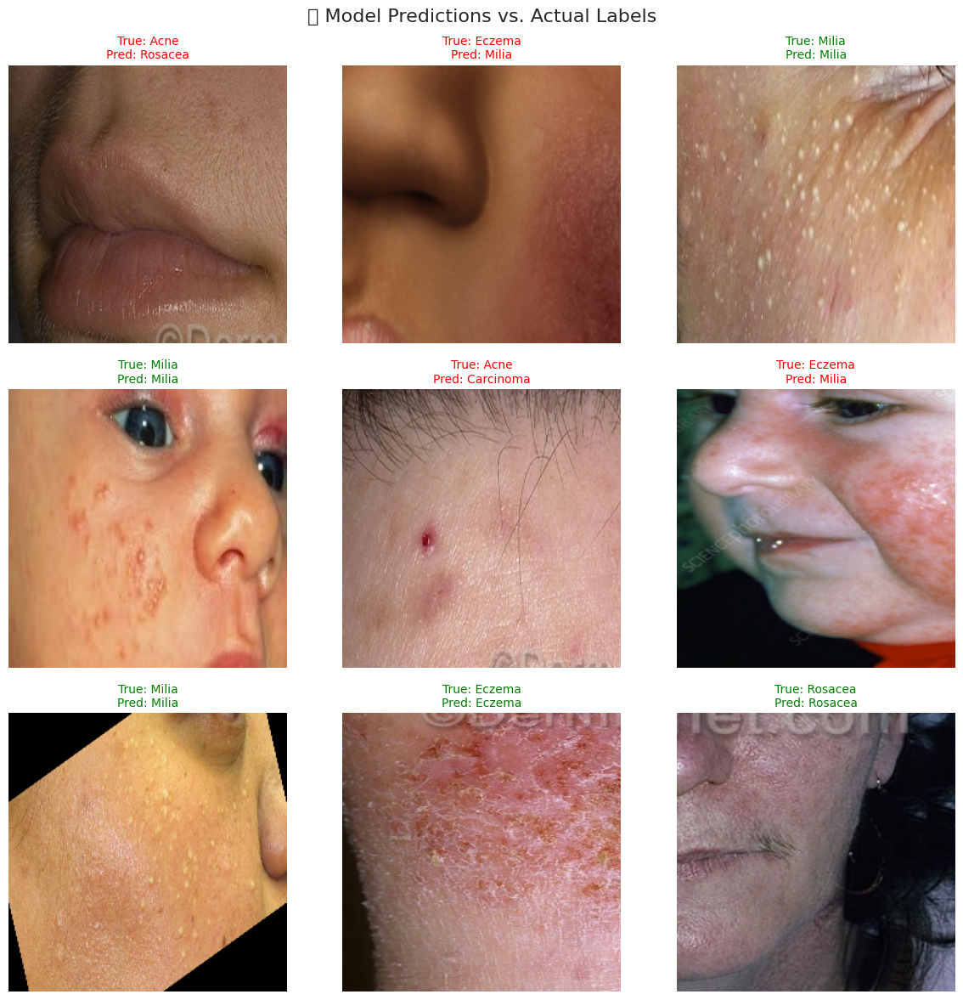

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Your class names
class_names = [
    'Acne',
    'Carcinoma',
    'Eczema',
    'Keratosis',
    'Milia',
    'Rosacea'
]

def plot_random_predictions(test_data, model, class_names, num_images=9):
    """
    Randomly selects and displays predictions on test images.

    Parameters:
        test_data (tf.data.Dataset): The test dataset.
        model (tf.keras.Model): Trained model to evaluate.
        class_names (list): List of class label names.
        num_images (int): Number of images to display (must be a square number).
    """
    fig, axes = plt.subplots(int(np.sqrt(num_images)), int(np.sqrt(num_images)), figsize=(12, 12))
    axes = axes.flatten()

    # Take one batch from the test set
    for image_batch, label_batch in test_data.take(1):
        # Predict class probabilities
        predictions = model.predict(image_batch)
        predicted_labels = np.argmax(predictions, axis=1)

        # Choose random indices to visualize
        indices = np.random.choice(len(image_batch), num_images, replace=False)

        for i, idx in enumerate(indices):
            img = image_batch[idx].numpy().astype("uint8")
            true_label = label_batch[idx].numpy()
            pred_label = predicted_labels[idx]

            # Display the image
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(
                f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
                color='green' if true_label == pred_label else 'red',
                fontsize=10
            )

    plt.suptitle("🔍 Model Predictions vs. Actual Labels", fontsize=16)
    plt.tight_layout()
    plt.show()

# Example usage
plot_random_predictions(test_data, best_efficientnet_model, class_names)


# Finetune Process for better result on the model accuracy and val_loss

In [13]:
# Unfreeze top layers of the base model
base_model_effnet.trainable = True

# Optionally freeze bottom layers to retain low-level features
for layer in base_model_effnet.layers[:100]:  # You can reduce/increase 100 as needed
    layer.trainable = False


In [15]:
# Re-compile with lower LR for fine-tuning
efficientnet_model.compile(
    optimizer=Adam(learning_rate=3e-4),  # 🔼 Increased from 1e-4
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Display model architecture
efficientnet_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,313 (16.08 MB)

 Trainable params: 3,840,348 (14.65 MB)

 Non-trainable params: 373,965 (1.43 MB)

In [17]:
# Retrain model
history_finetuned_eff = efficientnet_model.fit(
    train_data,
    validation_data=val_data,
    epochs=50,  # ⬆️ More epochs to fine-tune
    callbacks=[early_stop, model_checkpoint],
    verbose=1
)


Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6528 - loss: 1.0151
Epoch 1: val_loss improved from 0.43865 to 0.42229, saving model to best_efficientnet_model.keras
52/52 ━━━━━━━━━━━━━━━━━━━━ 304s 5s/step - accuracy: 0.6550 - loss: 1.0097 - val_accuracy: 0.8477 - val_loss: 0.4223
Epoch 2/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9019 - loss: 0.2904
Epoch 2: val_loss improved from 0.42229 to 0.16838, saving model to best_efficientnet_model.keras
52/52 ━━━━━━━━━━━━━━━━━━━━ 273s 5s/step - accuracy: 0.9022 - loss: 0.2897 - val_accuracy: 0.9403 - val_loss: 0.1684
Epoch 3/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9505 - loss: 0.1730
Epoch 3: val_loss did not improve from 0.16838
52/52 ━━━━━━━━━━━━━━━━━━━━ 301s 5s/step - accuracy: 0.9505 - loss: 0.1727 - val_accuracy: 0.9034 - val_loss: 0.2634
Epoch 4/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9699 - loss: 0.1039
Epoch 4: val_loss improved from 0.16838 to 0.09190, saving model to best_effi

In [18]:
# Load the best model after fine-tuning
best_finetuned_model = load_model(
    'best_efficientnet_model.keras',
    custom_objects={'preprocess_input': preprocess_input}
)

# Evaluate again
test_loss, test_accuracy = best_finetuned_model.evaluate(test_data, verbose=1)
print(f"\n📊 Fine-Tuned EfficientNetB0 Test Accuracy: {test_accuracy * 100:.2f}%")
print(f"📉 Test Loss: {test_loss:.4f}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9816 - loss: 0.0402

📊 Fine-Tuned EfficientNetB0 Test Accuracy: 98.44%
📉 Test Loss: 0.0480


# Checking again with test data, after model finetuning process and evaluation of the models efficiency...

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


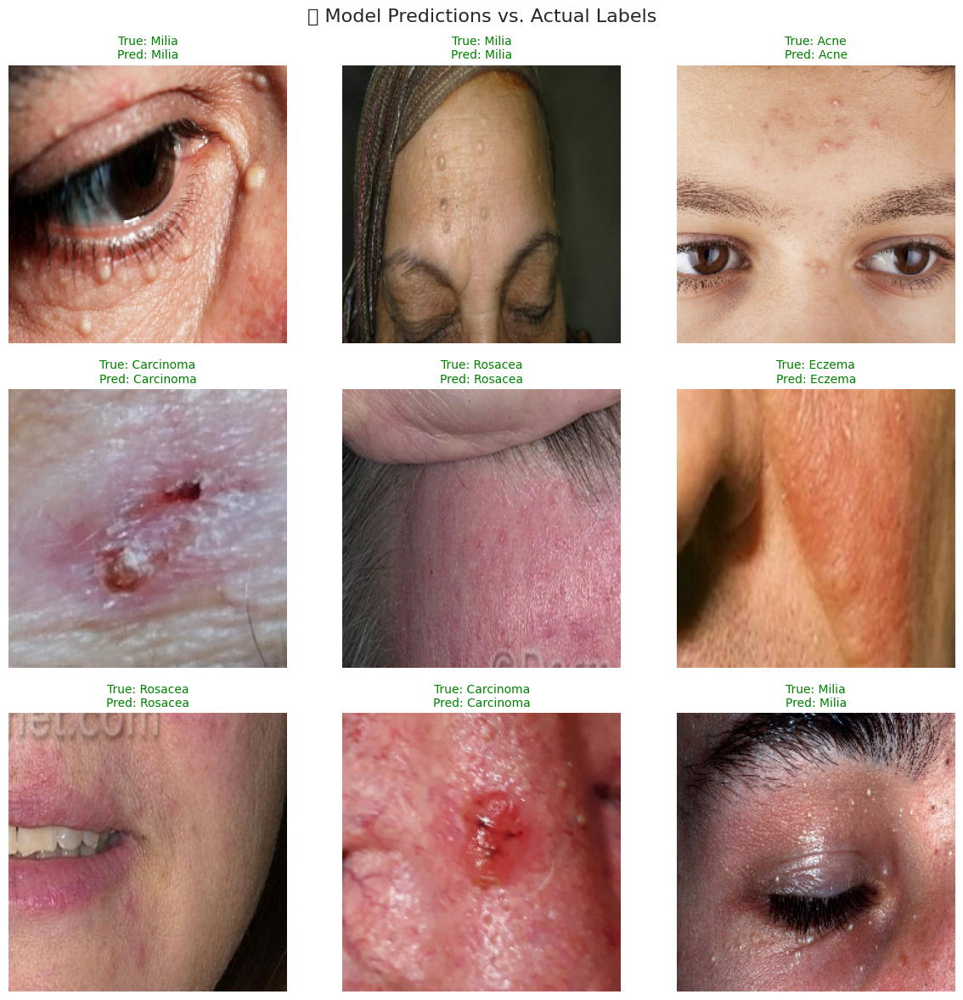

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Your class names
class_names = [
    'Acne',
    'Carcinoma',
    'Eczema',
    'Keratosis',
    'Milia',
    'Rosacea'
]

def plot_random_predictions(test_data, model, class_names, num_images=9):
    """
    Randomly selects and displays predictions on test images.

    Parameters:
        test_data (tf.data.Dataset): The test dataset.
        model (tf.keras.Model): Trained model to evaluate.
        class_names (list): List of class label names.
        num_images (int): Number of images to display (must be a square number).
    """
    fig, axes = plt.subplots(int(np.sqrt(num_images)), int(np.sqrt(num_images)), figsize=(12, 12))
    axes = axes.flatten()

    # Take one batch from the test set
    for image_batch, label_batch in test_data.take(1):
        # Predict class probabilities
        predictions = model.predict(image_batch)
        predicted_labels = np.argmax(predictions, axis=1)

        # Choose random indices to visualize
        indices = np.random.choice(len(image_batch), num_images, replace=False)

        for i, idx in enumerate(indices):
            img = image_batch[idx].numpy().astype("uint8")
            true_label = label_batch[idx].numpy()
            pred_label = predicted_labels[idx]

            # Display the image
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(
                f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
                color='green' if true_label == pred_label else 'red',
                fontsize=10
            )

    plt.suptitle("🔍 Model Predictions vs. Actual Labels", fontsize=16)
    plt.tight_layout()
    plt.show()

# Example usage
plot_random_predictions(test_data, best_finetuned_model, class_names)


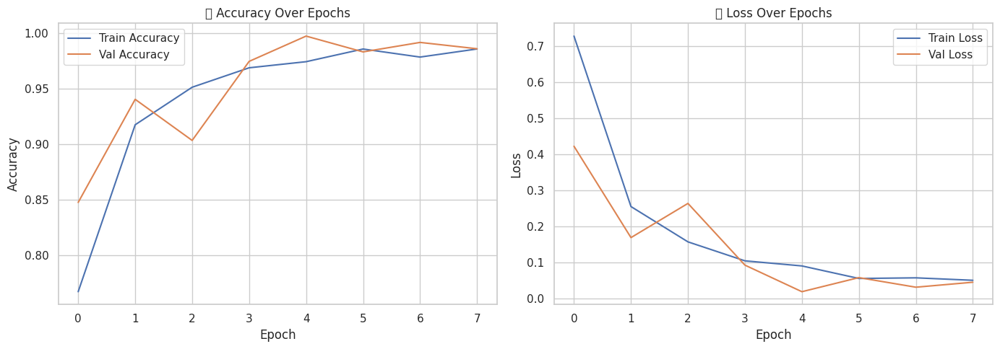

In [21]:
# Plot training history
plt.figure(figsize=(14, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history_finetuned_eff.history['accuracy'], label='Train Accuracy')
plt.plot(history_finetuned_eff.history['val_accuracy'], label='Val Accuracy')
plt.title('📈 Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history_finetuned_eff.history['loss'], label='Train Loss')
plt.plot(history_finetuned_eff.history['val_loss'], label='Val Loss')
plt.title('📉 Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


# Saving model

In [35]:
# ✅ Save in recommended format (TensorFlow SavedModel/Keras format)
best_finetuned_model.save('/content/drive/MyDrive/Colab_Notebooks/efficientnet_model_skin_condition.keras')


In [36]:
# Convert to TFLite format
converter = tf.lite.TFLiteConverter.from_keras_model(best_finetuned_model)
tflite_model = converter.convert()

# Save the TFLite model
with open('/content/drive/MyDrive/Colab_Notebooks/efficientnet_model_skin_condition.tflite', 'wb') as f:
    f.write(tflite_model)


Saved artifact at '/tmp/tmp7jcsd013'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 6), dtype=tf.float32, name=None)
Captures:
  138902907830928: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138902907843408: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138902880530896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880532624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880533968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880532816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880529744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880533776: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880533008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138902880526096: TensorSpec(shape=(), dtype=tf.resource, name=Non

# Testing Model with Real Life Data and Showing Confidence Level for Top 3 Classes

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


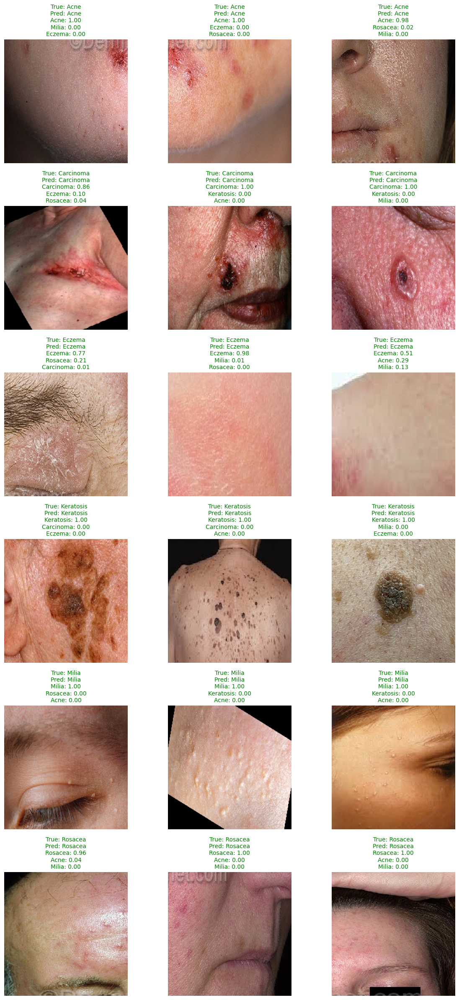

In [31]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image

# Class labels (order must match model training)
class_names = ['Acne', 'Carcinoma', 'Eczema', 'Keratosis', 'Milia', 'Rosacea']

# Prediction and display function
def predict_multiple_images_per_class(base_folder, model, class_names, num_images=3):
    fig, axes = plt.subplots(len(class_names), num_images, figsize=(num_images * 4, len(class_names) * 4))

    for class_index, class_name in enumerate(class_names):
        class_folder = os.path.join(base_folder, class_name)
        image_files = [f for f in os.listdir(class_folder) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
        selected_files = image_files[:num_images]

        for i, img_file in enumerate(selected_files):
            img_path = os.path.join(class_folder, img_file)
            img = image.load_img(img_path, target_size=(224, 224))
            img_array = image.img_to_array(img)
            input_tensor = tf.expand_dims(img_array, axis=0)
            input_tensor = tf.keras.applications.efficientnet.preprocess_input(input_tensor)

            predictions = model.predict(input_tensor)
            top_3_indices = predictions[0].argsort()[-3:][::-1]
            top_3_scores = predictions[0][top_3_indices]
            top_3_labels = [class_names[idx] for idx in top_3_indices]

            predicted_label = top_3_labels[0]
            true_label = class_name

            ax = axes[class_index, i]
            ax.imshow(img_array.astype("uint8"))
            ax.axis('off')
            title_color = 'green' if predicted_label == true_label else 'red'
            top_preds_text = "\n".join([f"{lbl}: {score:.2f}" for lbl, score in zip(top_3_labels, top_3_scores)])
            ax.set_title(f"True: {true_label}\nPred: {predicted_label}\n{top_preds_text}", fontsize=10, color=title_color)

    plt.tight_layout()
    plt.show()

# Run the function
predict_multiple_images_per_class(
    base_folder='/content/drive/MyDrive/Colab_Notebooks/Skin_Conditions',
    model=best_finetuned_model,
    class_names=class_names,
    num_images=3
)


# Testing and Comparing the 3 Models (CNN, Resnet50 and EfficientNet)

In [37]:
cnn_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/skin_condition_model.h5')
resnet_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/resnet_model_skin_condition.h5', custom_objects={'preprocess_input': tf.keras.applications.resnet50.preprocess_input})
efficient_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/efficientnet_model_skin_condition.keras', custom_objects={'preprocess_input': tf.keras.applications.efficientnet.preprocess_input})


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/st

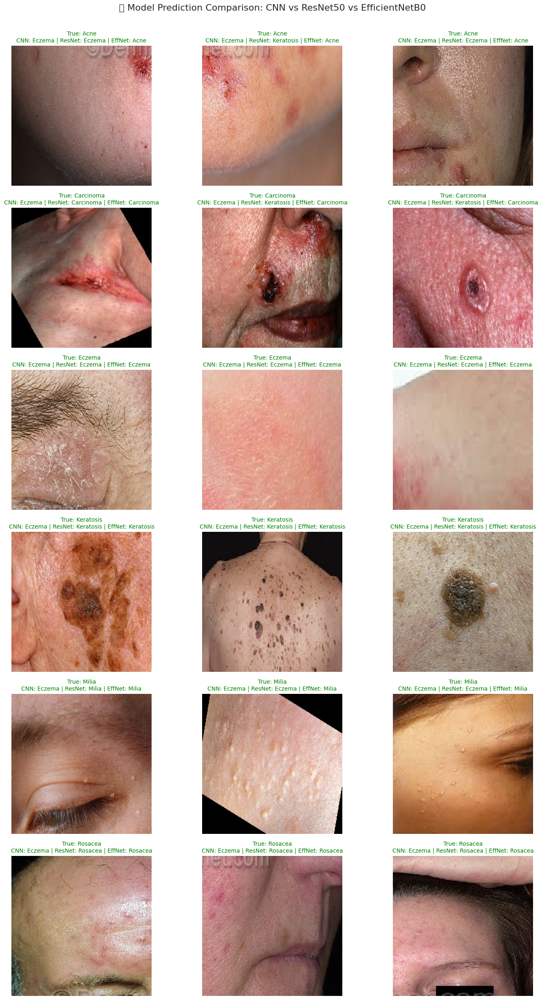

In [38]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image

# Class labels used during training
class_names = ['Acne', 'Carcinoma', 'Eczema', 'Keratosis', 'Milia', 'Rosacea']

def preprocess_input_model_specific(img_array, model_name):
    img_array = tf.image.resize(img_array, (224, 224))
    img_array = tf.expand_dims(img_array, axis=0)

    if model_name == 'resnet':
        return tf.keras.applications.resnet50.preprocess_input(img_array)
    elif model_name == 'efficientnet':
        return tf.keras.applications.efficientnet.preprocess_input(img_array)
    else:  # cnn
        return img_array / 255.0

def compare_models_on_images(base_folder, cnn_model, resnet_model, efficient_model, class_names, num_images=3):
    fig, axes = plt.subplots(len(class_names), num_images, figsize=(num_images * 5, len(class_names) * 4))

    for class_index, class_name in enumerate(class_names):
        class_folder = os.path.join(base_folder, class_name)
        image_files = [f for f in os.listdir(class_folder) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
        selected_files = image_files[:num_images]

        for i, img_file in enumerate(selected_files):
            img_path = os.path.join(class_folder, img_file)
            img = image.load_img(img_path, target_size=(224, 224))
            img_array = image.img_to_array(img).astype("uint8")

            # Preprocess for each model
            input_cnn = preprocess_input_model_specific(img_array, 'cnn')
            input_res = preprocess_input_model_specific(img_array, 'resnet')
            input_eff = preprocess_input_model_specific(img_array, 'efficientnet')

            # Predict
            pred_cnn = class_names[np.argmax(cnn_model.predict(input_cnn))]
            pred_res = class_names[np.argmax(resnet_model.predict(input_res))]
            pred_eff = class_names[np.argmax(efficient_model.predict(input_eff))]

            # Plot
            ax = axes[class_index, i]
            ax.imshow(img_array.astype("uint8"))
            ax.axis('off')
            title = f"True: {class_name}\nCNN: {pred_cnn} | ResNet: {pred_res} | EffNet: {pred_eff}"
            ax.set_title(title, fontsize=10, color='green' if class_name in (pred_cnn, pred_res, pred_eff) else 'red')

    plt.tight_layout()
    plt.suptitle("🔍 Model Prediction Comparison: CNN vs ResNet50 vs EfficientNetB0", fontsize=16, y=1.02)
    plt.show()

# Run comparison
compare_models_on_images(
    base_folder='/content/drive/MyDrive/Colab_Notebooks/Skin_Conditions',
    cnn_model=cnn_model,
    resnet_model=resnet_model,
    efficient_model=best_finetuned_model,
    class_names=class_names,
    num_images=3
)
